In [1]:
import stt as st
import scanpy as sc
import matplotlib as mpl

/Users/cliffzhou/anaconda3/envs/stt/lib/python3.7/site-packages/pyemma/__init__.py:92: UserWarning: You are not using the latest release of PyEMMA. Latest is 2.5.7, you have 2.5.6.
  .format(latest=latest, current=current), category=UserWarning)


In [2]:
adata = sc.read_h5ad('../data/toggle_switch/data_toggle_new.h5ad')

In [3]:
import scvelo as scv
scv.pp.moments(adata)

computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [5]:
adata.obs['attractor']=adata.obs['leiden']
adata_aggr = st.tl.dynamical_iteration(adata,n_states =2, n_iter = 20, n_neighbors = 100, n_components = 20, weight_connectivities=0.2, monitor_mode=False, l2 =0.1)


Quantiles for entropy relative difference with last iteration:
0.00   NaN
0.25   NaN
0.50   NaN
0.75   NaN
1.00   NaN
dtype: float64

Quantiles for entropy absolute difference with last iteration:
0.00    5.328138e-10
0.25    9.866067e-06
0.50    1.200742e-04
0.75    4.072803e-04
1.00    6.929915e-01
dtype: float64

Quantiles for entropy relative difference with last iteration:
0.00      0.000000
0.25      0.087192
0.50      0.267193
0.75      0.421075
1.00    219.351540
dtype: float64

Quantiles for entropy absolute difference with last iteration:
0.00    0.000000
0.25    0.000003
0.50    0.000021
0.75    0.000033
1.00    0.617681
dtype: float64

Quantiles for entropy relative difference with last iteration:
0.00    0.000000
0.25    0.144271
0.50    0.157173
0.75    0.192889
1.00    3.448483
dtype: float64

Quantiles for entropy absolute difference with last iteration:
0.00    0.000000e+00
0.25    9.624693e-07
0.50    1.334729e-05
0.75    5.275989e-05
1.00    4.124529e-01
dtype: floa

/Users/cliffzhou/Documents/GitHub/STT/example_notebooks/stt/tl/_dynamical_analysis.py:336: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  sc_object_aggr.obs['entropy'] = adata.obs['entropy'].values


In [6]:
import scvelo as scv
sc.tl.pca(adata_aggr, svd_solver='arpack')

In [7]:
adata_aggr.obs['rho_1']= adata.uns['da_out']['membership'][:,1]
adata_aggr.obs['attractor'] = adata.obs['attractor']
adata_aggr.obs['leiden'] = adata.obs['leiden']

In [8]:
sc.set_figure_params(dpi=600,fontsize = 18)
sc.pl.embedding(adata_aggr,color = ['leiden','attractor','speed','entropy'],basis = 'pca')

In [10]:
scv.tl.velocity_graph(adata_aggr,n_jobs=-1)

computing velocity graph (using 8/8 cores)


  0%|          | 0/10010 [00:00<?, ?cells/s]

[0]PETSC ERROR: ------------------------------------------------------------------------
[0]PETSC ERROR: Caught signal number 13 Broken Pipe: Likely while reading or writing to a socket
/Users/cliffzhou/anaconda3/envs/stt/lib/python3.7/site-packages/scvelo/core/_parallelize.py:138: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = np.array(res) if as_array else res


    finished (0:01:39) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:02) --> added
    'velocity_pca', embedded velocity vectors (adata.obsm)


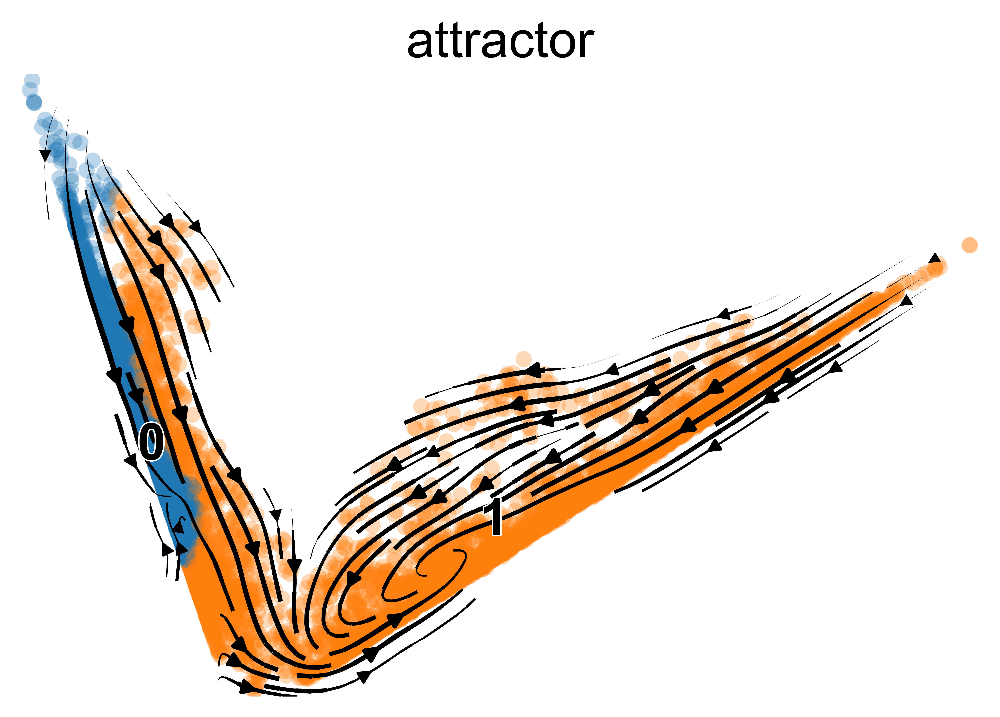

In [11]:
scv.set_figure_params(dpi =600,fontsize = 18)
scv.pl.velocity_embedding_stream(adata_aggr, basis='pca', color='attractor')

In [ ]:
import numpy as np
def cosine_similarity(vec1, vec2):
    dot_product = np.dot(vec1, vec2)
    norm_vec1 = np.linalg.norm(vec1)
    norm_vec2 = np.linalg.norm(vec2)
    return dot_product / (norm_vec1 * norm_vec2)

arr1 = adata.layers['v_u']
arr2 = adata.obsm['tensor_v_aver'][:,:,0]
adata.obs['cos_u_st'] = np.array([cosine_similarity(arr1[i, :], arr2[i, :]) for i in range(arr1.shape[0])])

arr1 = adata.layers['v_u']
arr2 = adata.layers['velocity_u']
adata.obs['cos_u_scv'] = np.array([cosine_similarity(arr1[i, :], arr2[i, :]) for i in range(arr1.shape[0])])

arr1 = adata.layers['v_s']
arr2 = adata.obsm['tensor_v_aver'][:,:,1]
adata.obs['cos_s_st'] = np.array([cosine_similarity(arr1[i, :], arr2[i, :]) for i in range(arr1.shape[0])])

arr1 = adata.layers['v_s']
arr2 = adata.layers['velocity']
adata.obs['cos_s_scv'] = np.array([cosine_similarity(arr1[i, :], arr2[i, :]) for i in range(arr1.shape[0])])


In [ ]:
adata.obs

In [ ]:
sc.pl.embedding(adata,color = ['cos_u_st','cos_u_scv','cos_s_st','cos_s_scv'],basis = 'pca')

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
df_melted = adata.obs.melt(value_vars=['cos_u_st','cos_u_scv','cos_s_st','cos_s_scv'])
# Plot
plt.figure(figsize=(10, 6))
sns.boxplot(x='variable', y='value', data=df_melted)
plt.title('Comparison of cosine similarities')
plt.ylabel('Value')
plt.show()

In [ ]:
adata.write('toggle_results.h5ad')

#import numpy as np
#np.save('../data/toggle_switch/toggle_pca.npy',adata_aggr.obsm['X_pca'])

View of AnnData object with n_obs × n_vars = 10010 × 2
    obs: 'leiden', 'velocity_u_self_transition', 'v_s_self_transition', 'v_u_self_transition', 'attractor', 'entropy', 'speed'
    var: 'fit_alpha', 'fit_beta', 'fit_gamma', 'fit_t_', 'fit_scaling', 'fit_std_u', 'fit_std_s', 'fit_likelihood', 'fit_u0', 'fit_s0', 'fit_pval_steady', 'fit_steady_u', 'fit_steady_s', 'fit_variance', 'fit_alignment_scaling', 'fit_r2', 'velocity_genes', 'r2_train', 'r2_test'
    uns: 'leiden', 'leiden_colors', 'neighbors', 'recover_dynamics', 'v_s_graph', 'v_s_graph_neg', 'v_s_params', 'v_u_graph', 'v_u_graph_neg', 'v_u_params', 'velocity_params', 'velocity_u_graph', 'velocity_u_graph_neg', 'velocity_u_params', 'da_out', 'par', 'kernel', 'r2_keep_train', 'r2_keep_test', 'gene_subset'
    obsm: 'X_coord', 'X_pca', 'coord', 'v_s_coord', 'v_u_coord', 'v_u_pca', 'velocity_u_coord', 'tensor_v', 'tensor_v_aver', 'rho', 'X_pca_aggr'
    varm: 'loss'
    layers: 'fit_t', 'fit_tau', 'fit_tau_', 'spliced', 'unsplic

  0%|          | 0/10010 [00:00<?, ?cells/s]

KeyboardInterrupt: 

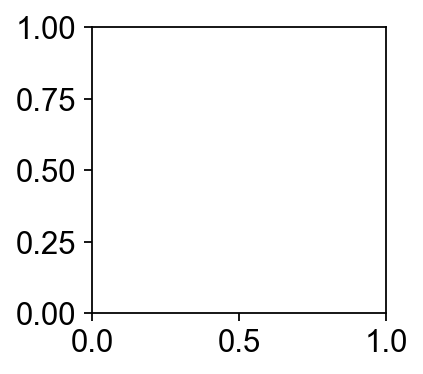

In [12]:
sc.set_figure_params(fontsize = 14)
import matplotlib as mpl
mpl.rcParams['axes.grid'] = False
adata.obsm['X_pca_aggr']=adata_aggr.obsm['X_pca']
st.pl.plot_tensor(adata, adata_aggr,  basis = 'pca')

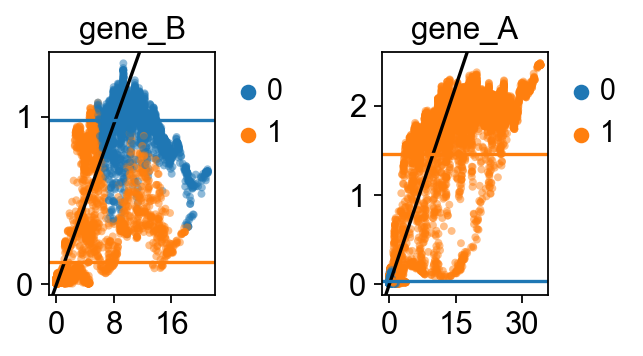

In [13]:
st.pl.plot_top_genes(adata, top_genes = 2, ncols =8, wspace = 1, hspace = 1,figsize=(20,2))

In [ ]:
adata.var['r2_test']

In [ ]:
adata.var['r2_train']

In [15]:
kernel = adata.uns['kernel']

  0%|          | 0/1000 [00:00<?, ?sim/s]

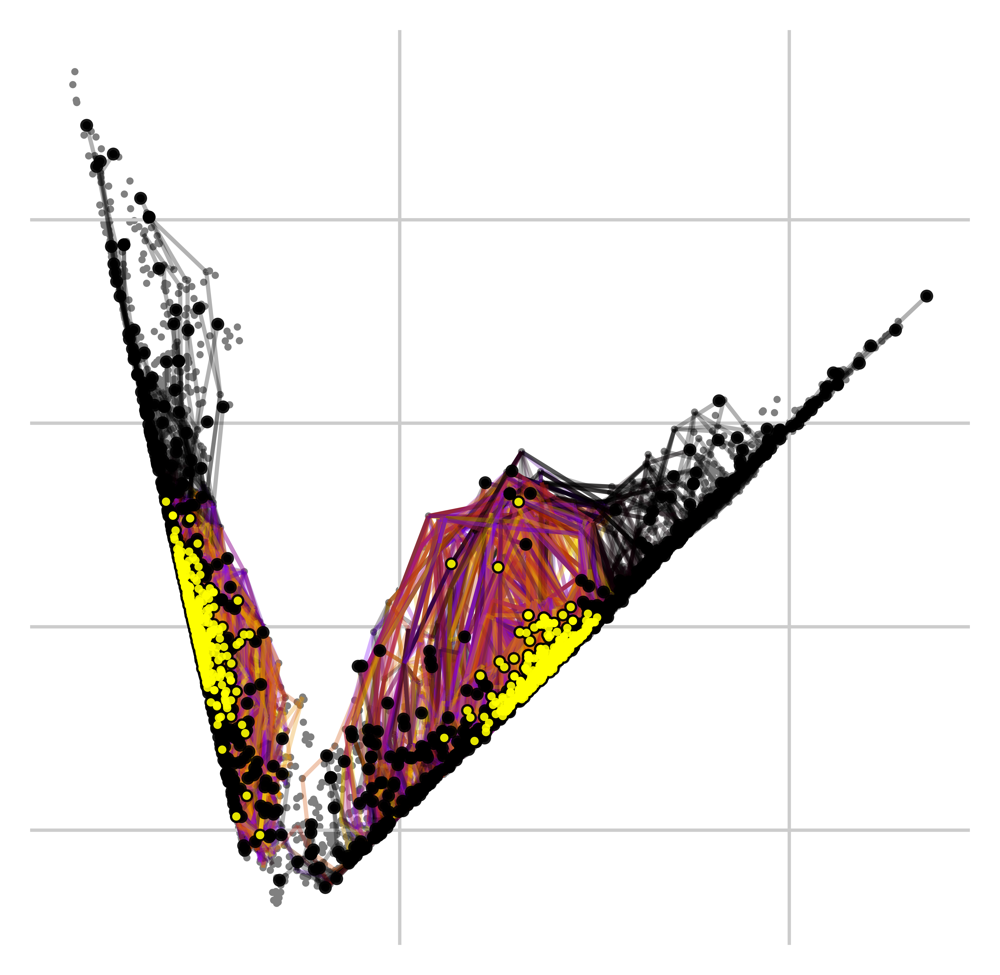

In [28]:
kernel.plot_random_walks(n_sims=1000,basis='pca',n_jobs=-1)

In [27]:
import cellrank as cr
help(cr.tl.kernels.ConnectivityKernel)

Help on class VelocityKernel in module cellrank.tl.kernels._velocity_kernel:

class VelocityKernel(cellrank.tl.kernels._base_kernel.Kernel)
 |  VelocityKernel(adata: anndata._core.anndata.AnnData, backward: bool = False, vkey: str = 'velocity', xkey: str = 'Ms', gene_subset: Union[Iterable, NoneType] = None, compute_cond_num: bool = False, check_connectivity: bool = False)
 |  
 |  Kernel which computes a transition matrix based on RNA velocity.
 |  
 |  This borrows ideas from both [Manno18]_ and [Bergen20]_. In short, for each cell *i*, we compute transition
 |  probabilities :math:`p_{i, j}` to each cell *j* in the neighborhood of *i*. The transition probabilities are
 |  computed as a multinomial logistic regression where the weights :math:`w_j` (for all *j*) are given by the vector
 |  that connects cell *i* with cell *j* in gene expression space, and the features :math:`x_i` are given
 |  by the velocity vector :math:`v_i` of cell *i*.
 |  
 |  Parameters
 |  ----------
 |  adata

In [ ]:
help(cr.tl.estimators.GPCCA.compute_schur)